In [2]:
#Collect the dates and hours of the event into two lists
dates = ['20220724','20220725','20220726','20220727','20220728','20220729','20220730','20220731']
hours = ['0000','0600','1200','1800']

#Store the website to take data from inside a variable
url_root = "https://www.ncei.noaa.gov/data/north-american-mesoscale-model/access/analysis/"

#Combine the lists and website variable into one list to pull the correct files
files_to_download = [url_root + date[0:6] + '/' + date + '/' + 'nam_218_' + date + '_' + hour + '_000.grb2' for date in dates for hour in hours]

#Use for loop to download files from internet
for file in files_to_download:
    #!wget $file
    !curl -# -O $file
    print(file)

######################################################################### 100.0%
https://www.ncei.noaa.gov/data/north-american-mesoscale-model/access/analysis/202207/20220724/nam_218_20220724_0000_000.grb2
######################################################################### 100.0%
https://www.ncei.noaa.gov/data/north-american-mesoscale-model/access/analysis/202207/20220724/nam_218_20220724_0600_000.grb2
######################################################################### 100.0%
https://www.ncei.noaa.gov/data/north-american-mesoscale-model/access/analysis/202207/20220724/nam_218_20220724_1200_000.grb2
######################################################################### 100.0%
https://www.ncei.noaa.gov/data/north-american-mesoscale-model/access/analysis/202207/20220724/nam_218_20220724_1800_000.grb2
######################################################################### 100.0%
https://www.ncei.noaa.gov/data/north-american-mesoscale-model/access/analysis/202207/20220725/n

/var/folders/k5/9pfttj9d3fq6g8b3g_td2z848n6svb/T/ipykernel_45659/494575360.py:627: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(14,12))


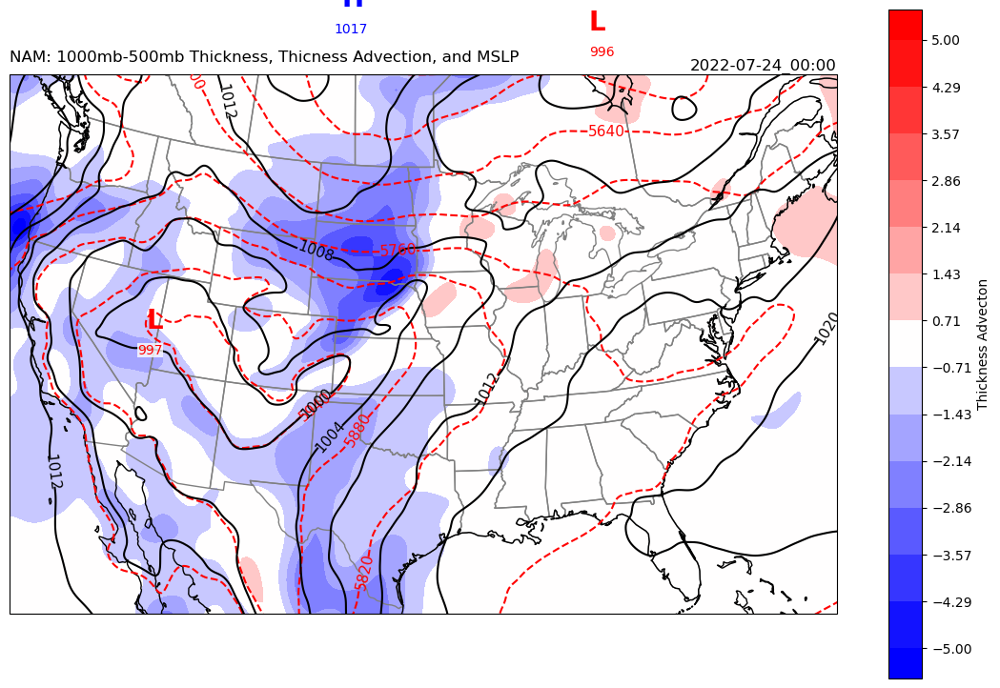

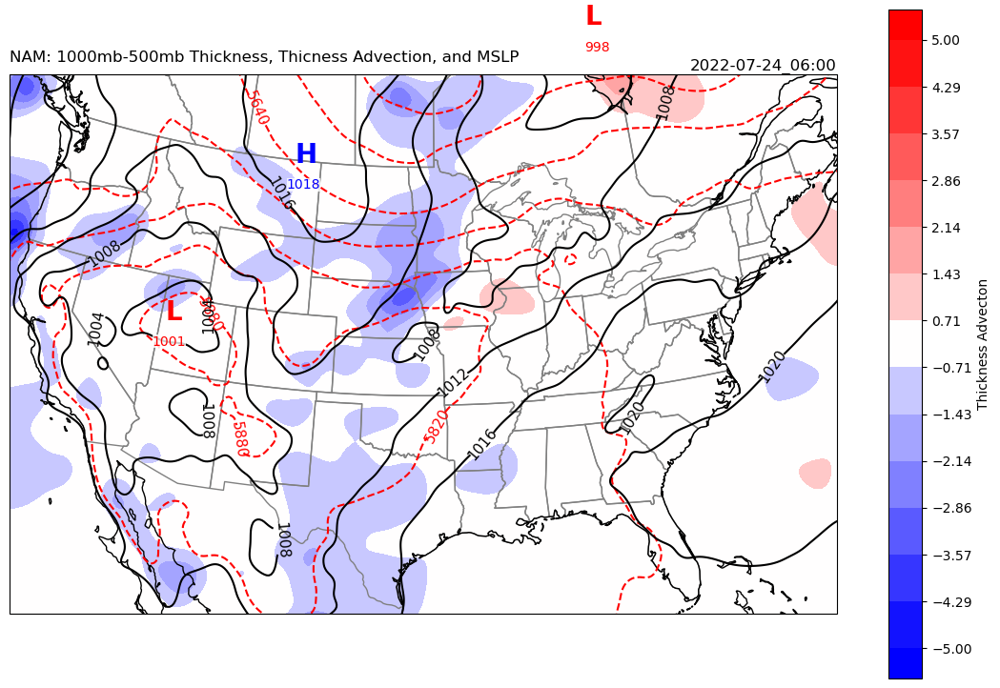

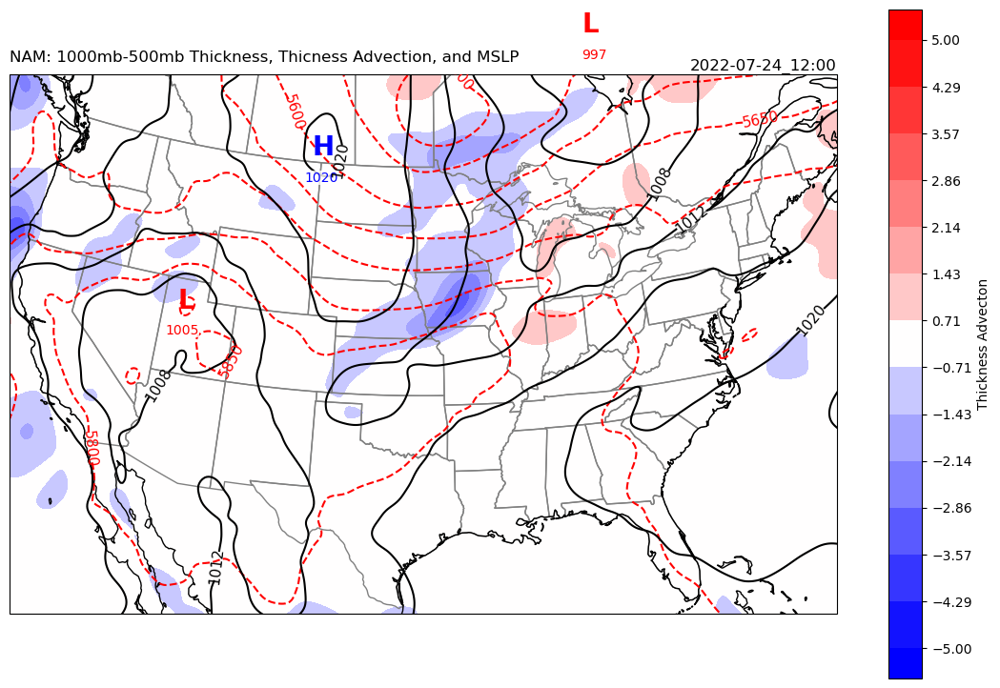

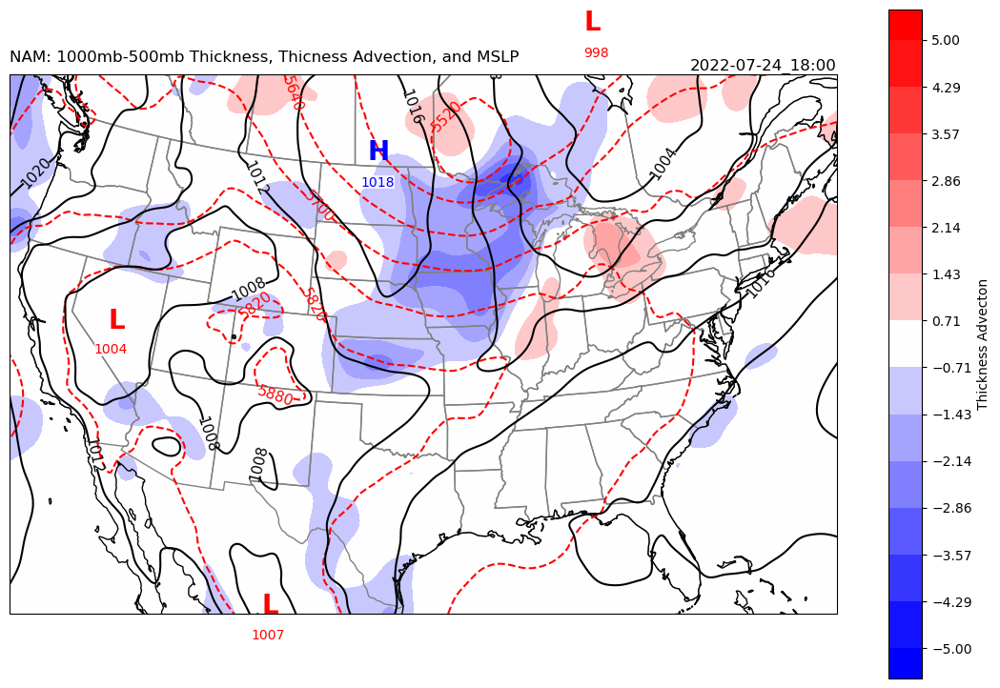

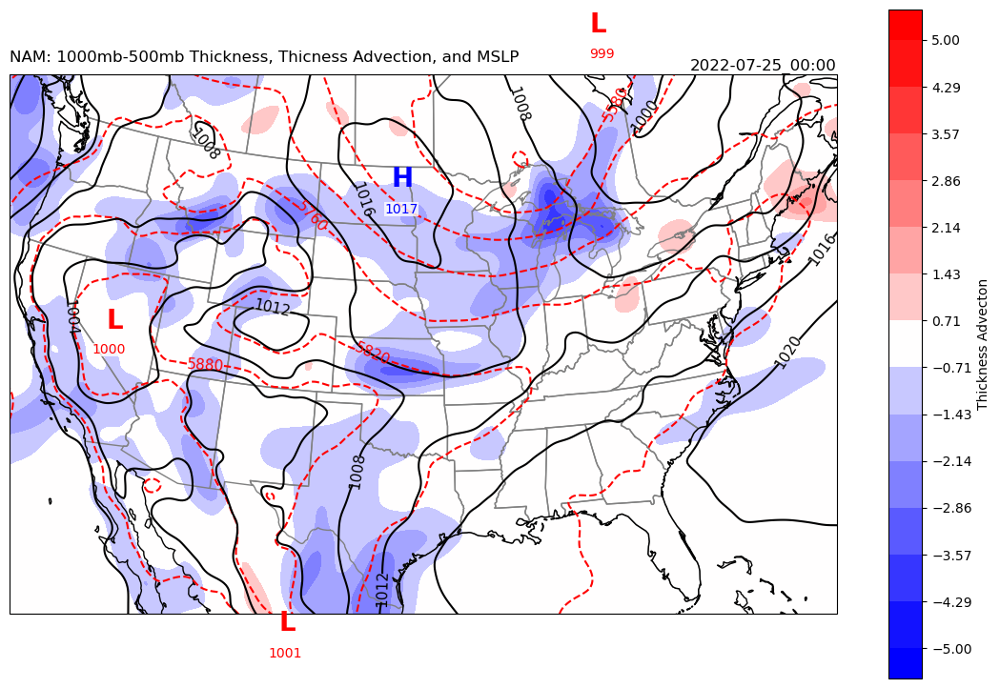

...

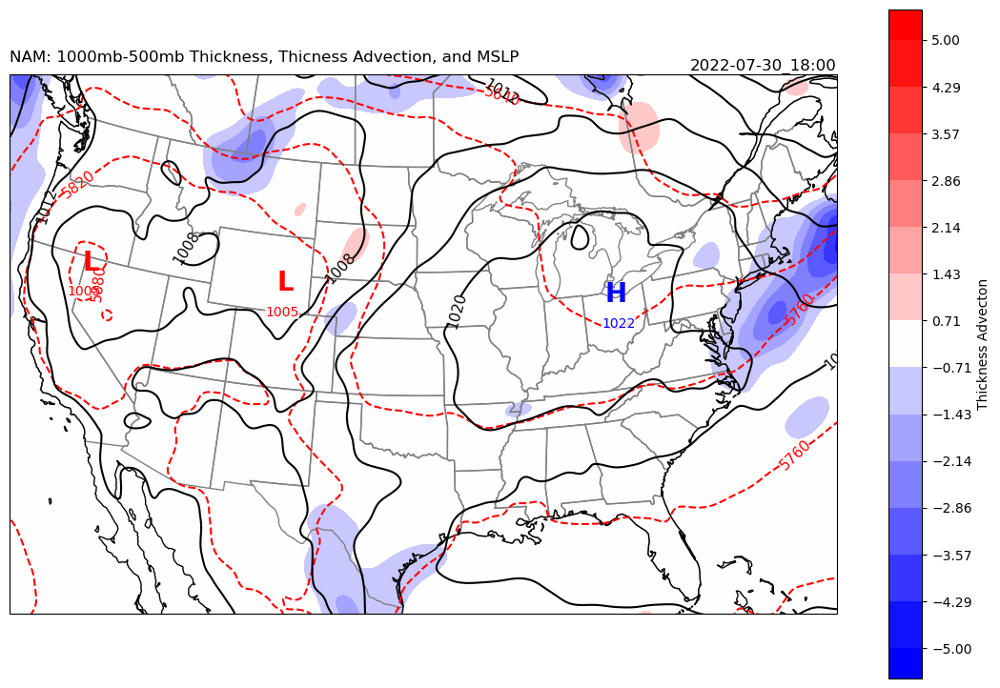

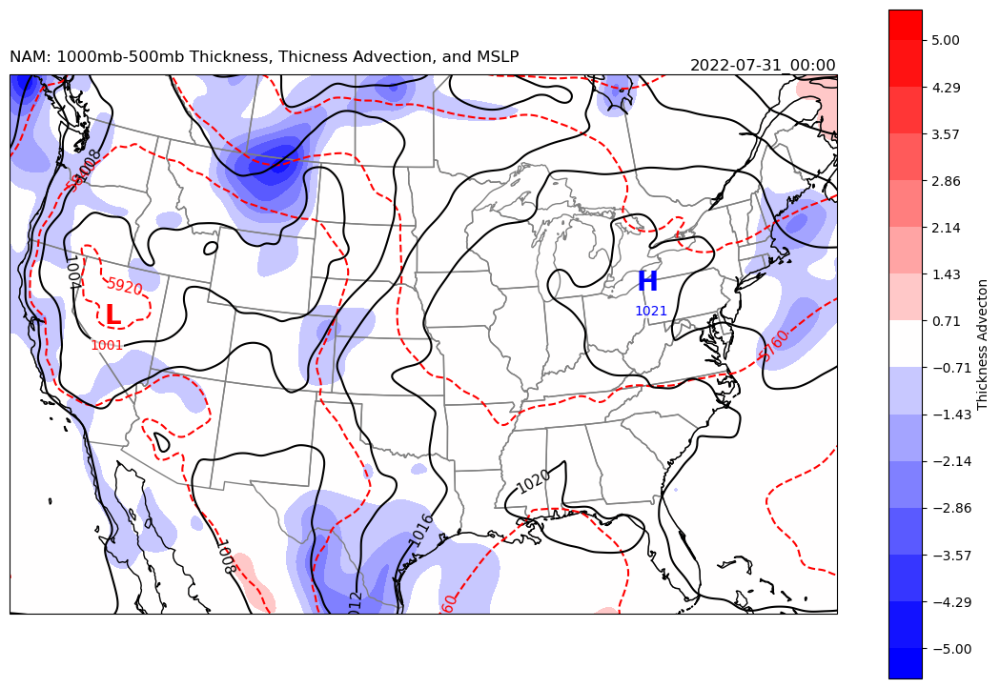

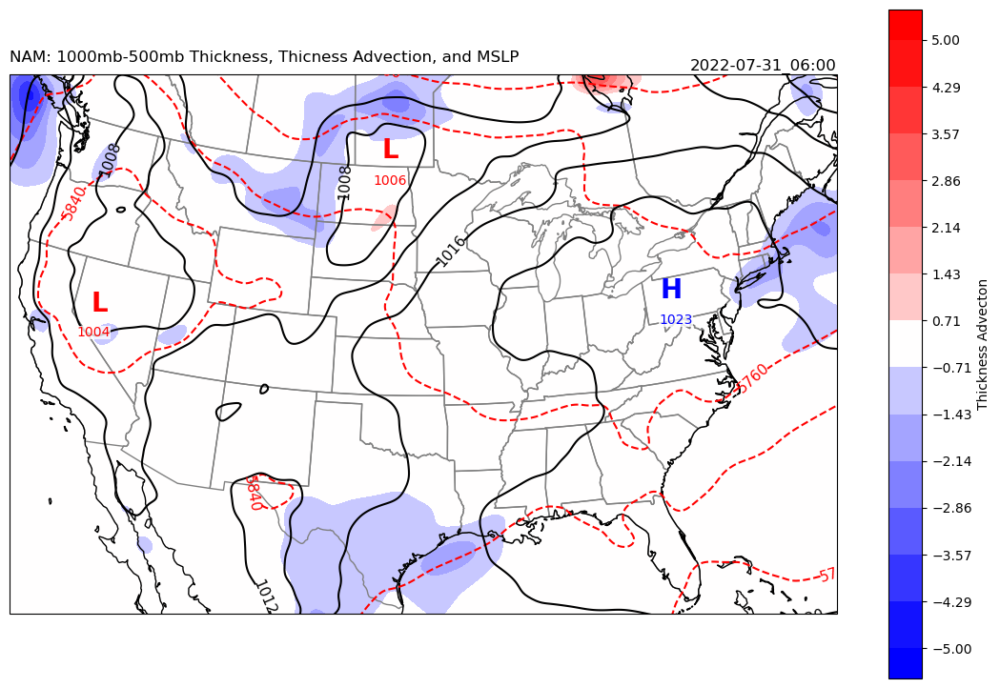

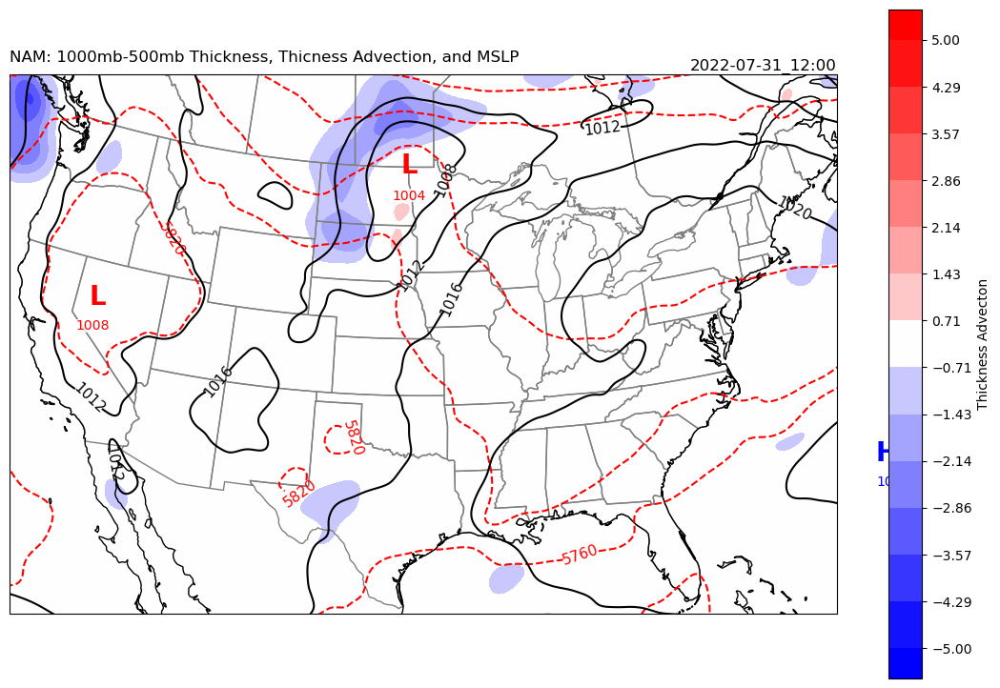

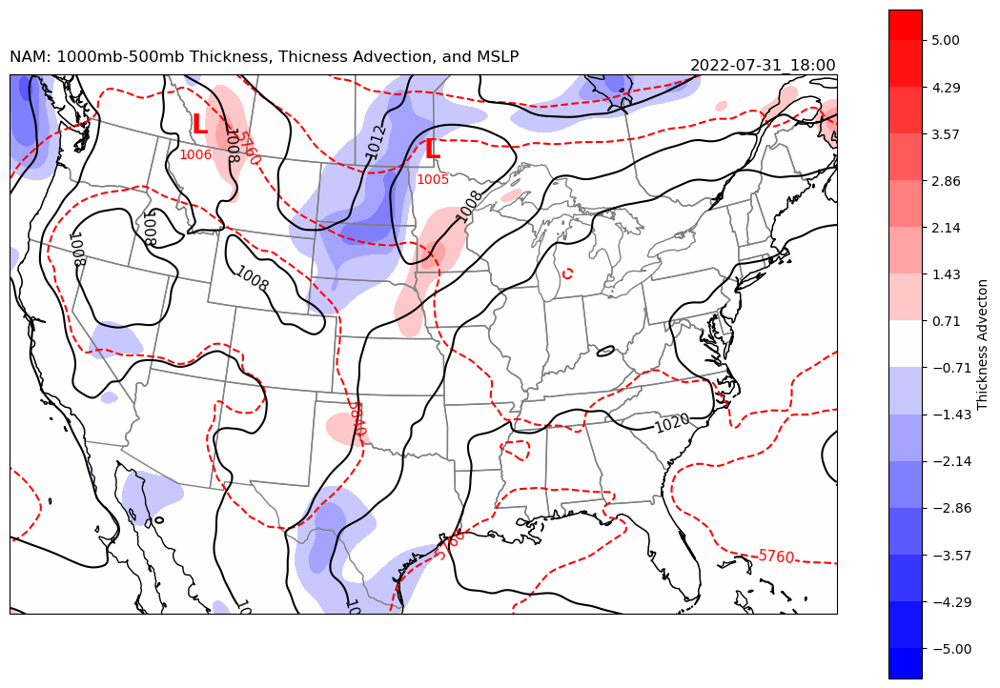

In [136]:
#Import all necessary python libraries
import Nio
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from datetime import datetime, timedelta
from glob import glob
from metpy.units import units
import metpy.calc as metcalc
from scipy.ndimage import gaussian_filter
from scipy.ndimage import minimum_filter, maximum_filter

#Sort all files by date
path = './'
files = sorted(glob(path+'nam_218_2022*.grb2'))

#Collect some common fields from first file 
f = Nio.open_file(files[0])

nx = f.dimensions['xgrid_0']                   # dimensions
ny = f.dimensions['ygrid_0']
npres = f.dimensions['lv_ISBL0']

lats=f.variables['gridlat_0'].get_value()      # coordinates
lons=f.variables['gridlon_0'].get_value()
rot =f.variables['gridrot_0'].get_value()
pres=f.variables['lv_ISBL0'].get_value()
pres5 = f.variables['lv_ISBL5'].get_value()

#Close the file
f.close()

#Define the projections used
map_proj = ccrs.LambertConformal()
data_proj = ccrs.PlateCarree()

###Start Defining level functions here
#Define a function to display
def mb250(file):
    #Define the pressure variable
    hPaLvl = 25000
    paLvl = np.where(pres==hPaLvl)[0][0]
    
    #Open the file
    f = Nio.open_file(file)
    
    #Pull the time from a variable
    tinit=f.variables['TMP_P0_L1_GLC0'].attributes['initial_time']
    time = datetime.strptime(tinit, '%m/%d/%Y (%H:%M)')
    
    #Double check that the time is pulled correctly
    filenm_time = datetime.strptime(file[10:23], '%Y%m%d_%H%M')
    if filenm_time != time:
        sys.exit(-1, 'file time problem, stopped')
    
    #Grab the needed variables for the pressure level
    hght = f.variables['HGT_P0_L100_GLC0'].get_value()[paLvl,:,:]
    U = f.variables['UGRD_P0_L100_GLC0'].get_value()[paLvl,:,:] * 1.944 #Convert to knots
    V = f.variables['VGRD_P0_L100_GLC0'].get_value()[paLvl,:,:] * 1.944 #Convert to knots
    
    #Change wind to account for rotation
    UE = np.sin(rot)*V + np.cos(rot)*U
    VE = np.cos(rot)*V - np.sin(rot)*U
    
    #Define wind speed
    spd = np.hypot(UE,VE)
    
    #Smooth hght and apd
    hght = gaussian_filter(hght, sigma=5)
    spd = gaussian_filter(spd, sigma=5)
    
    #Define figure for display and add subplot
    fig = plt.figure(figsize=(14,12))
    ax = fig.add_subplot(111,projection=map_proj)
    
    #Set extent of the map to just the US
    ax.set_extent([-119,-73,23,52])
    
    #Add map features
    ax.add_feature(cfeature.STATES, edgecolor='gray')
    ax.coastlines(color='black')
    
    #Define skip variable
    s = 50
    
    #Plot the varaibles for the pressure height, wind barbs, and windspeed
    spdct = ax.contourf(lons, lats, spd, levels=np.arange(60,181,20), vmin=60,vmax=200, transform=data_proj, cmap='cool', alpha=0.8)
    gpm250 = ax.contour(lons,lats,hght,levels=range(10300,11201,60),transform=data_proj,colors='k')
    plt.clabel(gpm250,fontsize=11,inline=True,fmt='%i',rightside_up=True)
    ax.barbs(lons[::s,::s], lats[::s,::s],UE[::s,::s],VE[::s,::s],transform=data_proj,lw=0.2)
    
    #create colorbar for wind speed
    spdCB = plt.colorbar(spdct,shrink=0.76,pad=0.05)
    spdCB.set_label(r'Speed (kt)')
    
    #Create map title
    ax.set_title('NAM: {:.0f}mb Height and Winds'.format(hPaLvl/100),loc='left')
    ax.set_title(time.strftime('%Y-%m-%d_%H:%M'), transform=ax.transAxes,loc='right')
    
    #Save the image to the correct folder
    relPath = 'Desktop/250mb_maps'
    outfile = 'NAM_{:.0f}mb_{:s}.png'.format(hPaLvl/100, time.strftime('%Y%m%d_%H%M'))
    plt.savefig(relPath+outfile, bbox_inches='tight', pad_inches=0.1) 
    
    #Close the file
    f.close

def mb500(file):
    #Define the pressure variable and pull the pressure surface for vorticity from ISBL5
    hPaLvl = 50000
    paLvl = np.where(pres==hPaLvl)[0][0]
    paLvl5 = np.where(pres5==hPaLvl)[0][0]
    
    #Define levels and Norm for Abs Vorticity
    norm = mcolors.TwoSlopeNorm(vmin=-0.001, vcenter=0, vmax=0.001)
    levels = np.linspace(-0.001,0.001,17)
    
    #Open the file
    f = Nio.open_file(file)
    
    #Pull the time from a variable
    tinit=f.variables['TMP_P0_L1_GLC0'].attributes['initial_time']
    time = datetime.strptime(tinit, '%m/%d/%Y (%H:%M)')
    
    #Double check that the time is pulled correctly
    filenm_time = datetime.strptime(file[10:23], '%Y%m%d_%H%M')
    if filenm_time != time:
        sys.exit(-1, 'file time problem, stopped')
    
    #Grab the needed variables for the pressure level
    hght = f.variables['HGT_P0_L100_GLC0'].get_value()[paLvl,:,:]
    U = f.variables['UGRD_P0_L100_GLC0'].get_value()[paLvl,:,:]* 1.944 #Convert to knots
    V = f.variables['VGRD_P0_L100_GLC0'].get_value()[paLvl,:,:]* 1.944 #Convert to knots
    avor = f.variables['ABSV_P0_L100_GLC0'].get_value()[paLvl5,:,:]
    
    #Smooth height and avor
    hght = gaussian_filter(hght, sigma=5)
    avor = gaussian_filter(avor, sigma=5)
    
    #Change wind to account for rotation
    UE = np.sin(rot)*V + np.cos(rot)*U
    VE = np.cos(rot)*V - np.sin(rot)*U
    
    #Define figure for display and add subplot
    fig = plt.figure(figsize=(14,12))
    ax = fig.add_subplot(111,projection=map_proj)
    
    #Set extent of the map to just the US
    ax.set_extent([-119,-73,23,52])
    
    #Add map features
    ax.add_feature(cfeature.STATES, edgecolor='gray')
    ax.coastlines(color='black')
    
    ###Absolute Vorticity Color map #code pulled from here https://unidata.github.io/python-gallery/examples/500hPa_Absolute_Vorticity_winds.html
    # Use two different colormaps from matplotlib and combine into one color set
    avor_lvl = list(range(-8, 1, 1))+list(range(8, 46, 1))
    colors1 = plt.cm.YlOrRd(np.linspace(0, 1, 48))
    colors2 = plt.cm.BuPu(np.linspace(0.5, 0.75, 8))
    colors = np.vstack((colors2, (1, 1, 1, 1), colors1))
    ###End copied code
    
    #Define skip variable
    s = 50
    
    #Plot the varaibles for the pressure height, wind barbs, and absolute vorticity
    gpm500 = ax.contour(lons,lats,hght,levels=range(5520,6001,40),transform=data_proj,colors='k')
    plt.clabel(gpm500,fontsize=11,inline=True,fmt='%i',rightside_up=True)
    avorCF = ax.contourf(lons,lats,units.s**(-1)*avor*1e5,levels=avor_lvl,colors=colors,transform=data_proj)
    ax.barbs(lons[::s,::s], lats[::s,::s],UE[::s,::s],VE[::s,::s],transform=data_proj,lw=0.2)
    
    #create colorbar for avor
    avorCB = plt.colorbar(avorCF,shrink=0.76,pad=0.05)
    avorCB.set_label(r'Absolute Vorticity $(s^{-1})$')
    
    #Create map title
    ax.set_title('NAM: {:.0f}mb Height, Absolute Vorticity, and Wind'.format(hPaLvl/100),loc='left')
    ax.set_title(time.strftime('%Y-%m-%d_%H:%M'), transform=ax.transAxes,loc='right')
    
    #Save the image to the correct folder
    relPath = 'Desktop/500mb_maps/'
    outfile = 'NAM_{:.0f}mb_{:s}.png'.format(hPaLvl/100, time.strftime('%Y%m%d_%H%M'))
    plt.savefig(relPath+outfile, bbox_inches='tight', pad_inches=0.1) 
    
    #Close the file
    f.close
    
def va500(file):
    #Define the pressure variables
    hPaLvl = 50000
    lvl700 = 70000
    lvl400 = 40000
    paLvl = np.where(pres==hPaLvl)[0][0]
    paLvl5 = np.where(pres5==hPaLvl)[0][0]
    pa700 = np.where(pres==lvl700)[0][0]
    pa400 = np.where(pres==lvl400)[0][0]
    
    #Define levels and Norm for Abs Vorticity and advection
    norm = mcolors.TwoSlopeNorm(vmin=-0.001, vcenter=0, vmax=0.001)
    levels = np.linspace(-0.001,0.001,17)
    adLvl = np.arange(-15,15-5)
    
    #Open the file
    f = Nio.open_file(file)
    
    #Pull the time from a variable
    tinit=f.variables['TMP_P0_L1_GLC0'].attributes['initial_time']
    time = datetime.strptime(tinit, '%m/%d/%Y (%H:%M)')
    
    #Double check that the time is pulled correctly
    filenm_time = datetime.strptime(file[10:23], '%Y%m%d_%H%M')
    if filenm_time != time:
        sys.exit(-1, 'file time problem, stopped')
    
    #Grab the needed variables for the pressure level
    hght = f.variables['HGT_P0_L100_GLC0'].get_value()[paLvl,:,:]
    U = f.variables['UGRD_P0_L100_GLC0'].get_value()[paLvl,:,:]* 1.944 #Convert to knots
    V = f.variables['VGRD_P0_L100_GLC0'].get_value()[paLvl,:,:]* 1.944 #Convert to knots
    U700 = f.variables['UGRD_P0_L100_GLC0'].get_value()[pa700,:,:]
    V700 = f.variables['VGRD_P0_L100_GLC0'].get_value()[pa700,:,:]
    U400 = f.variables['UGRD_P0_L100_GLC0'].get_value()[pa400,:,:]
    V400 = f.variables['VGRD_P0_L100_GLC0'].get_value()[pa400,:,:]
    avor = f.variables['ABSV_P0_L100_GLC0'].get_value()[paLvl5,:,:]
    
    #Define dx and dy. I don't know what this does but you need it for the accursed thing to work
    dx, dy = 12.191, 12.191
    
    avAd7 = metcalc.absolute_vorticity(units.m*units.s**(-1)*U700, units.m*units.s**(-1)*V700,
                                       dx*units.km, dy*units.km, units.degree*lats)
    avAd4 = metcalc.absolute_vorticity(units.m*units.s**(-1)*U400, units.m*units.s**(-1)*V400,
                                       dx*units.km, dy*units.km, units.degree*lats)
    avAd74 = avAd4-avAd7
    
    avAd = metcalc.advection(avAd74, u=units.m*units.s**(-1)*U, v=units.m*units.s**(-1)*V,
                             dx=dx*units.km, dy=dy*units.km)
    
    #Smooth height and avor
    hght = gaussian_filter(hght, sigma=5)
    avor = gaussian_filter(avor, sigma=5)
    avAd = gaussian_filter(avAd*100, sigma=5)
    
    #Change wind to account for rotation
    UE = np.sin(rot)*V + np.cos(rot)*U
    VE = np.cos(rot)*V - np.sin(rot)*U
    
    #Define figure for display and add subplot
    fig = plt.figure(figsize=(14,12))
    ax = fig.add_subplot(111,projection=map_proj)
    
    #Set extent of the map to just the US
    ax.set_extent([-119,-73,23,52])
    
    #Add map features
    ax.add_feature(cfeature.STATES, edgecolor='gray')
    ax.coastlines(color='black')
    
    ###Absolute Vorticity Color map #code pulled from here https://unidata.github.io/python-gallery/examples/500hPa_Absolute_Vorticity_winds.html
    # Use two different colormaps from matplotlib and combine into one color set
    avor_lvl = list(range(-8, 1, 1))+list(range(8, 46, 1))
    colors1 = plt.cm.YlOrRd(np.linspace(0, 1, 48))
    colors2 = plt.cm.BuPu(np.linspace(0.5, 0.75, 8))
    colors = np.vstack((colors2, (1, 1, 1, 1), colors1))
    ###End copied code
    
    #Define skip variable
    s = 50
    
    #Plot the varaibles for the pressure height, wind barbs, and absolute vorticity
    gpm500 = ax.contour(lons,lats,hght,levels=range(5520,6001,60),transform=data_proj,colors='k')
    avorCF = ax.contourf(lons,lats,units.s**(-1)*avor*1e5,levels=avor_lvl,colors=colors,transform=data_proj)
    difAdv = ax.contour(lons,lats,avAd,levels=adLvl[adLvl!=0],cmap='bwr_r',transform=data_proj)
    plt.clabel(difAdv,fontsize=10,inline=1,inline_spacing=10,fmt='%i',rightside_up=True, use_clabeltext=True)
    ax.barbs(lons[::s,::s], lats[::s,::s],UE[::s,::s],VE[::s,::s],transform=data_proj,lw=0.2)
    
    #create colorbar for avor
    avorCB = plt.colorbar(avorCF,shrink=0.76,pad=0.05)
    avorCB.set_label(r'Absolute Vorticity $(s^{-1})$')
    
    #Create map title
    ax.set_title('NAM: {:.0f}-{:.0f}mb Differential Vorticity Advection'.format(lvl700/100,lvl400/100),loc='left')
    ax.set_title(time.strftime('%Y-%m-%d_%H:%M'), transform=ax.transAxes,loc='right')
    
    #Save the image to the correct folder
    relPath = 'Desktop/700_400mb_maps/'
    outfile = 'NAM_{:.0f}mb_{:s}.png'.format(hPaLvl/100, time.strftime('%Y%m%d_%H%M'))
    plt.savefig(relPath+outfile, bbox_inches='tight', pad_inches=0.1) 
    
    #Close the file
    f.close
    
def mb700(file):
    #Define the pressure variable
    hPaLvl = 70000
    paLvl = np.where(pres==hPaLvl)[0][0]
    
    #Open the file
    f = Nio.open_file(file)
    
    #Pull the time from a variable
    tinit=f.variables['TMP_P0_L1_GLC0'].attributes['initial_time']
    time = datetime.strptime(tinit, '%m/%d/%Y (%H:%M)')
    
    #Double check that the time is pulled correctly
    filenm_time = datetime.strptime(file[10:23], '%Y%m%d_%H%M')
    if filenm_time != time:
        sys.exit(-1, 'file time problem, stopped')
    
    #Grab the needed variables for the pressure level
    hght = f.variables['HGT_P0_L100_GLC0'].get_value()[paLvl,:,:]
    U = f.variables['UGRD_P0_L100_GLC0'].get_value()[paLvl,:,:]* 1.944 #Convert to knots
    V = f.variables['VGRD_P0_L100_GLC0'].get_value()[paLvl,:,:]* 1.944 #Convert to knots
    rhum = f.variables['RH_P0_L100_GLC0'].get_value()[paLvl,:,:]
    
    #Smooth height and rhum
    hght = gaussian_filter(hght, sigma=5)
    rhum = gaussian_filter(rhum, sigma=5)
    
    #Change wind to account for rotation
    UE = np.sin(rot)*V + np.cos(rot)*U
    VE = np.cos(rot)*V - np.sin(rot)*U
    
    #Define figure for display and add subplot
    fig = plt.figure(figsize=(14,12))
    ax = fig.add_subplot(111,projection=map_proj)
    
    #Set extent of the map to just the US
    ax.set_extent([-119,-73,23,52])
    
    #Add map features
    ax.add_feature(cfeature.STATES, edgecolor='gray')
    ax.coastlines(color='black')
    
    #Define skip variable
    s = 50
    
    #Plot the varaibles for the pressure height, wind barbs, and relative humidity
    gpm700 = ax.contour(lons,lats,hght,levels=range(2900,3261,20),transform=data_proj,colors='k')
    plt.clabel(gpm700,fontsize=11,inline=True,fmt='%i',rightside_up=True)
    rhumCF = ax.contourf(lons,lats,rhum,levels=range(70,101,10),transform=data_proj,cmap='Greens')
    ax.barbs(lons[::s,::s], lats[::s,::s],UE[::s,::s],VE[::s,::s],transform=data_proj,lw=0.2)
    
    #create colorbar for rhum
    rhumCB = plt.colorbar(rhumCF,shrink=0.76,pad=0.05)
    rhumCB.set_label(r'Relative Humidity (%)')
    
    #Create map title
    ax.set_title('NAM: {:.0f}mb Height, Relative Humidity, and Wind'.format(hPaLvl/100),loc='left')
    ax.set_title(time.strftime('%Y-%m-%d_%H:%M'), transform=ax.transAxes,loc='right')
    
    #Save the image to the correct folder
    relPath = 'Desktop/700mbRH_maps/'
    outfile = 'NAM_{:.0f}mb_{:s}.png'.format(hPaLvl/100, time.strftime('%Y%m%d_%H%M'))
    plt.savefig(relPath+outfile, bbox_inches='tight', pad_inches=0.1) 
    
    #Close the file
    f.close

def vv700(file):
    #Define the pressure variable
    hPaLvl = 70000
    paLvl = np.where(pres==hPaLvl)[0][0]
    
    #Define levels and Norm for vvel
    norm = mcolors.TwoSlopeNorm(vmin=0, vcenter=2.5, vmax=5)
    levels = np.linspace(0.25,1.75,15)
    
    #Open the file
    f = Nio.open_file(file)
    
    #Pull the time from a variable
    tinit=f.variables['TMP_P0_L1_GLC0'].attributes['initial_time']
    time = datetime.strptime(tinit, '%m/%d/%Y (%H:%M)')
    
    #Double check that the time is pulled correctly
    filenm_time = datetime.strptime(file[10:23], '%Y%m%d_%H%M')
    if filenm_time != time:
        sys.exit(-1, 'file time problem, stopped')
    
    #Grab the needed variables for the pressure level
    hght = f.variables['HGT_P0_L100_GLC0'].get_value()[paLvl,:,:]
    U = f.variables['UGRD_P0_L100_GLC0'].get_value()[paLvl,:,:]* 1.944 #Convert to knots
    V = f.variables['VGRD_P0_L100_GLC0'].get_value()[paLvl,:,:]* 1.944 #Convert to knots
    vvel = f.variables['VVEL_P0_L100_GLC0'].get_value()[paLvl,:,:]
    
    #Smooth height and vvel
    hght = gaussian_filter(hght, sigma=5)
    vvel = gaussian_filter(vvel, sigma=5)
    
    #Change wind to account for rotation
    UE = np.sin(rot)*V + np.cos(rot)*U
    VE = np.cos(rot)*V - np.sin(rot)*U
    
    #Define figure for display and add subplot
    fig = plt.figure(figsize=(14,12))
    ax = fig.add_subplot(111,projection=map_proj)
    
    #Set extent of the map to just the US
    ax.set_extent([-119,-73,23,52])
    
    #Add map features
    ax.add_feature(cfeature.STATES, edgecolor='gray')
    ax.coastlines(color='black')
    
    #Define skip variable
    s = 50
    
    #Plot the varaibles for the pressure height, wind barbs, and Vertical Velocity
    gpm700 = ax.contour(lons,lats,hght,levels=range(2900,3261,20),transform=data_proj,colors='k')
    plt.clabel(gpm700,fontsize=11,inline=True,fmt='%i',rightside_up=True)
    vvelCF = ax.contourf(lons,lats,vvel,levels=levels,transform=data_proj,cmap='YlGn')
    ax.barbs(lons[::s,::s], lats[::s,::s],UE[::s,::s],VE[::s,::s],transform=data_proj,lw=0.2)
    
    #create colorbar for vvel
    vvelCB = plt.colorbar(vvelCF,shrink=0.76,pad=0.05)
    vvelCB.set_label(r'Vertical Velocity $(\frac{Pa}{s})$')
    
    #Create map title
    ax.set_title('NAM: {:.0f}mb Height, Vertical Velocity, and Wind'.format(hPaLvl/100),loc='left')
    ax.set_title(time.strftime('%Y-%m-%d_%H:%M'), transform=ax.transAxes,loc='right')
    
    #Save the image to the correct folder
    relPath = 'Desktop/700mbVV_maps/'
    outfile = 'NAM_{:.0f}mb_{:s}.png'.format(hPaLvl/100, time.strftime('%Y%m%d_%H%M'))
    plt.savefig(relPath+outfile, bbox_inches='tight', pad_inches=0.1) 
    
    #Close the file
    f.close
    
def mb850(file):
    #Define the pressure variable
    hPaLvl = 85000
    paLvl = np.where(pres==hPaLvl)[0][0]
    
    #Define levels and Norm for Temp adv
    norm = mcolors.TwoSlopeNorm(vmin=-0.6, vcenter=0, vmax=0.6)
    levels = np.linspace(-0.60,0.60,15)
   
    #Open the file
    f = Nio.open_file(file)
    
    #Pull the time from a variable
    tinit=f.variables['TMP_P0_L1_GLC0'].attributes['initial_time']
    time = datetime.strptime(tinit, '%m/%d/%Y (%H:%M)')
    
    #Double check that the time is pulled correctly
    filenm_time = datetime.strptime(file[10:23], '%Y%m%d_%H%M')
    if filenm_time != time:
        sys.exit(-1, 'file time problem, stopped')
    
    #Grab the needed variables for the pressure level
    hght = f.variables['HGT_P0_L100_GLC0'].get_value()[paLvl,:,:]
    U = f.variables['UGRD_P0_L100_GLC0'].get_value()[paLvl,:,:]
    V = f.variables['VGRD_P0_L100_GLC0'].get_value()[paLvl,:,:]
    temp = f.variables['TMP_P0_L100_GLC0'].get_value()[paLvl,:,:] #- 273.15 #Convert to celsius
    
    #Define dx and dy. I don't know what this does but you need it for the accursed thing to work
    dx, dy = 12.191, 12.191
    
    #Calculate Temp Adv and convert to base units
    tadv = metcalc.advection(units.kelvin*temp, u=units.m*units.s**(-1)*U, v=units.m*units.s**(-1)*V,
                             dx=dx*units.km, dy=dy*units.km)* units('delta_degC/hour')
    
    #Smooth hght and tadv
    hght = gaussian_filter(hght, sigma=5)
    tadv = gaussian_filter(tadv, sigma=5)*units('delta_degC/hour')
    temp = gaussian_filter(temp-273.15, sigma=5)
    
    #Change wind to account for rotation
    UE = np.sin(rot)*V + np.cos(rot)*U
    VE = np.cos(rot)*V - np.sin(rot)*U
    
    #Define figure for display and add subplot
    fig = plt.figure(figsize=(14,12))
    ax = fig.add_subplot(111,projection=map_proj)
    
    #Set extent of the map to just the US
    ax.set_extent([-119,-73,23,52])
    
    #Add map features
    ax.add_feature(cfeature.STATES, edgecolor='gray')
    ax.coastlines(color='black')
    
    #Define skip variable
    s = 50
    
    #Plot the varaibles for the pressure height, wind barbs, and temperature advection
    tmp850 = ax.contour(lons,lats,temp,transform=data_proj,colors='grey',linewidths=1.25,linestyles='dashed')
    plt.clabel(tmp850,fontsize=10,inline=1,inline_spacing=10,fmt='%i',rightside_up=True, use_clabeltext=True)
    gpm850 = ax.contour(lons,lats,hght,levels=range(900,3000,30),transform=data_proj,colors='k')
    tadvCF = ax.contourf(lons,lats,tadv,levels=levels[levels!=0],norm=norm,extend='both',transform=data_proj,cmap='bwr')
    ax.barbs(lons[::s,::s], lats[::s,::s],UE[::s,::s],VE[::s,::s],transform=data_proj,lw=0.2)
    
    #create colorbar for tadv
    tadvCB = plt.colorbar(tadvCF,shrink=0.76,pad=0.05,ticks=levels[levels!=0],extendrect=True)
    tadvCB.set_label(r'Temperature Advecton $(\frac{\degree C}{hr})$')
    
    #Create map title
    ax.set_title('NAM: {:.0f}mb Height, Temperature Advection, and Wind'.format(hPaLvl/100),loc='left')
    ax.set_title(time.strftime('%Y-%m-%d_%H:%M'), transform=ax.transAxes,loc='right')
    
    #Save the image to the correct folder
    relPath = 'Desktop/850mbTA_maps/'
    outfile = 'NAM_{:.0f}mb_{:s}.png'.format(hPaLvl/100, time.strftime('%Y%m%d_%H%M'))
    plt.savefig(relPath+outfile, bbox_inches='tight', pad_inches=0.1) 
    
    #Close the file
    f.close

def mb850_2(file):
    ###The reason for making this is to examine the low lelvel jet as.the NWS has identified it as a possible source of the storms
    #Define the pressure variable
    hPaLvl = 85000
    paLvl = np.where(pres==hPaLvl)[0][0]
    
    #Open the file
    f = Nio.open_file(file)
    
    #Pull the time from a variable
    tinit=f.variables['TMP_P0_L1_GLC0'].attributes['initial_time']
    time = datetime.strptime(tinit, '%m/%d/%Y (%H:%M)')
    
    #Double check that the time is pulled correctly
    filenm_time = datetime.strptime(file[10:23], '%Y%m%d_%H%M')
    if filenm_time != time:
        sys.exit(-1, 'file time problem, stopped')
    
    #Grab the needed variables for the pressure level
    hght = f.variables['HGT_P0_L100_GLC0'].get_value()[paLvl,:,:]
    U = f.variables['UGRD_P0_L100_GLC0'].get_value()[paLvl,:,:]* 1.944 #Convert to knots
    V = f.variables['VGRD_P0_L100_GLC0'].get_value()[paLvl,:,:]* 1.944 #Convert to knots
    
    #Change wind to account for rotation
    UE = np.sin(rot)*V + np.cos(rot)*U
    VE = np.cos(rot)*V - np.sin(rot)*U
    
    #Define wind speed
    spd = np.hypot(UE,VE)
    
    #Smooth hght and apd
    hght = gaussian_filter(hght, sigma=3)
    spd = gaussian_filter(spd, sigma=3)
    
    #Define figure for display and add subplot
    fig = plt.figure(figsize=(14,12))
    ax = fig.add_subplot(111,projection=map_proj)
    
    #Set extent of the map to just the US
    ax.set_extent([-119,-73,23,52])
    
    #Add map features
    ax.add_feature(cfeature.STATES, edgecolor='gray')
    ax.coastlines(color='black')
    
    #Define skip variable
    s = 50
    
    #Plot the varaibles for the pressure height, wind barbs, and windspeed
    spdct = ax.contourf(lons, lats, spd,levels=np.arange(25,86,5),vmin=25,vmax=90,transform=data_proj, cmap='cool', alpha=0.8)
    gpm850 = ax.contour(lons,lats,hght,transform=data_proj,colors='k')
    ax.barbs(lons[::s,::s], lats[::s,::s],UE[::s,::s],VE[::s,::s],transform=data_proj,lw=0.2)
    
    #create colorbar for wind speed
    spdCB = plt.colorbar(spdct,shrink=0.76,pad=0.05)
    spdCB.set_label(r'Speed (kt)')
    
    #Create map title
    ax.set_title('NAM: {:.0f}mb Height and Winds'.format(hPaLvl/100),loc='left')
    ax.set_title(time.strftime('%Y-%m-%d_%H:%M'), transform=ax.transAxes,loc='right')
    
    #Save the image to the correct folder
    relPath = 'Desktop/850mbLLJ_maps/'
    outfile = 'NAM_{:.0f}mb_{:s}.png'.format(hPaLvl/100, time.strftime('%Y%m%d_%H%M'))
    plt.savefig(relPath+outfile, bbox_inches='tight', pad_inches=0.1) 
    
    #Close the file
    f.close

def thck15(file):
    #Define the two pressure variables for thickness
    hPaLvl = 50000
    hPaLvl2 = 100000
    paLvl1 = np.where(pres==hPaLvl)[0][0]
    paLvl2 = np.where(pres==hPaLvl2)[0][0]
    
    #Define levels and Norm for Thck adv
    norm = mcolors.TwoSlopeNorm(vmin=-5, vcenter=0, vmax=5)
    levels = np.linspace(-5,5,15)
    
    #Open the file
    f = Nio.open_file(file)
    
    #Pull the time from a variable
    tinit=f.variables['TMP_P0_L1_GLC0'].attributes['initial_time']
    time = datetime.strptime(tinit, '%m/%d/%Y (%H:%M)')
    
    #Double check that the time is pulled correctly
    filenm_time = datetime.strptime(file[10:23], '%Y%m%d_%H%M')
    if filenm_time != time:
        sys.exit(-1, 'file time problem, stopped')
    
    #Grab the needed variables for the pressure level
    hght1 = f.variables['HGT_P0_L100_GLC0'].get_value()[paLvl1,:,:]
    hght2 = f.variables['HGT_P0_L100_GLC0'].get_value()[paLvl2,:,:]
    U = f.variables['UGRD_P0_L100_GLC0'].get_value()[paLvl2,:,:]* 1.944 #Convert to knots
    V = f.variables['VGRD_P0_L100_GLC0'].get_value()[paLvl2,:,:]* 1.944 #Convert to knots
    mslp = f.variables['MSLET_P0_L101_GLC0'].get_value()
    
    #Define dx and dy. I don't know what this does but you need it for the accursed thing to work
    dx, dy = 12.191, 12.191
    
    #Convert mslp to hPa and smooth
    mslp = gaussian_filter(mslp/100,sigma=3)
    
    #Calculate and smooth thickness
    thck = gaussian_filter(hght1-hght2,sigma=3)
    
    #Calculate Thck Adv and smooth it
    thckadv = metcalc.advection(units.m*thck, u=units.m*units.s**(-1)*U, v=units.m*units.s**(-1)*V,
                             dx=dx*units.km, dy=dy*units.km)
    thckadv = gaussian_filter(thckadv,sigma=5)
    
    #Define figure for display and add subplot
    fig = plt.figure(figsize=(14,12))
    ax = fig.add_subplot(111,projection=map_proj)
    ax.margins(0)
    
    #Set extent of the map to just the US
    ext = ax.set_extent([-119,-73,23,52])
    
    #Add map features
    ax.add_feature(cfeature.STATES, edgecolor='gray')
    ax.coastlines(color='black')
    
    ###Begin code for locating Highs and Lows #Thank you Dr. Fan
    # the window parameter controls the number of highs and lows detected.
    # (higher value, fewer highs and lows)
    local_min, local_max = extrema(mslp, mode='wrap', window=150)

    lon_lows = lons[local_min]; lon_highs = lons[local_max]
    lat_lows = lats[local_min]; lat_highs = lats[local_max]
    lowvals  = mslp[local_min];  highvals  = mslp[local_max]
    
    # plot lows as red L's, with min pressure value underneath.
    yoffset = 1.2
    for lon,lat,p in zip(lon_lows, lat_lows, lowvals):
        ax.text(lon,lat,'L',fontsize=20,fontweight='bold',transform=data_proj,
                ha='center',va='center',color='r').set_clip_on(True)
        ax.text(lon,lat-yoffset,repr(int(p)),fontsize=10,transform=data_proj,
                ha='center',va='top',color='r',
                bbox = dict(boxstyle="square",ec='None',pad=0.01,fc=(1,1,1,0.8))).set_clip_on(True)
        
    # plot highs as blue H's, with max pressure value underneath.
    for lon,lat,p in zip(lon_highs, lat_highs, highvals):
        ax.text(lon,lat,'H',fontsize=20,fontweight='bold',transform=data_proj,
                ha='center',va='center',color='b').set_clip_on(True)
        ax.text(lon,lat-yoffset,repr(int(p)),fontsize=10,transform=data_proj,    # repr() similar as str()
                ha='center',va='top',color='b',
                bbox = dict(boxstyle="square",ec='None',pad=0.01, fc=(1,1,1,0.8))).set_clip_on(True)
    
    #plot mslp and thickness
    thckPl = ax.contour(lons,lats,thck,transform=data_proj,colors='r',linestyles='dashed')
    plt.clabel(thckPl,fontsize=11,inline=True,fmt='%i',rightside_up=True)
    sfcp = ax.contour(lons,lats,mslp,levels=range(992,1033,4),transform=data_proj,colors='k')
    plt.clabel(sfcp,fontsize=11,inline=True,fmt='%i',rightside_up=True)
    
    #Plot thickness adv
    thckadvCF = ax.contourf(lons,lats,thckadv,levels=levels[levels!=0],norm=norm,extend='both',transform=data_proj,cmap='bwr')

    #Create Colorbar
    thckadvCB = plt.colorbar(thckadvCF,shrink=0.76,pad=0.05,ticks=levels[levels!=0],extendrect=True)
    thckadvCB.set_label(r'Thickness Advecton')
    
    #Create map title
    ax.set_title('NAM: {:.0f}mb-{:.0f}mb Thickness, Thicness Advection, and MSLP'.format(hPaLvl2/100,hPaLvl/100),loc='left')
    ax.set_title(time.strftime('%Y-%m-%d_%H:%M'), transform=ax.transAxes,loc='right')
    
    #Save the image to the correct folder
    relPath = 'Desktop/1000_500mb_maps/'
    outfile = 'NAM_{:.0f}mb_{:s}.png'.format(hPaLvl/100, time.strftime('%Y%m%d_%H%M'))
    plt.savefig(relPath+outfile, bbox_inches='tight', pad_inches=0.1) 
    
    #Close the file
    f.close
    

#Use for loop to create all maps
for file in files:
    #mb250(file)
    #mb500(file)
    #va500(file)
    #mb700(file)
    #vv700(file)
    #mb850(file)
    #mb850_2(file)
    thck15(file)
    